<a href="https://colab.research.google.com/github/JfGuerrero1/utae-paps/blob/main/exploration_donnees_projet_remote.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# -q pour "quiet" (évite d'afficher des milliers de lignes de noms de fichiers)
# -d pour définir le dossier de destination
!unzip  "LIGHT_DATASET.zip" -d "/content/data_pastis/"

unzip:  cannot find or open LIGHT_DATASET.zip, LIGHT_DATASET.zip.zip or LIGHT_DATASET.zip.ZIP.


In [ ]:
# Vérifie que les dossiers DATA_S2 et ANNOTATIONS sont présents
!ls -R /content/data_pastis/

ls: cannot access '/content/data_pastis/': No such file or directory


In [ ]:
import geopandas as gpd
import folium


gdf = gpd.read_file('/content/data_pastis/light_data/PASTIS_R/metadata.geojson')

# 2. Créer une carte centrée sur la zone (ex: Pertuis, France)
m = folium.Map(location=[43.7, 5.5], zoom_start=13)

# 3. Ajouter les polygones à la carte
folium.GeoJson(gdf).add_to(m)

# 4. Afficher la carte
m

In [ ]:
import pandas as pd
df_meta = pd.DataFrame(gdf)
df_meta.head()

,Fold,ID_PATCH,N_Parcel,Parcel_Cover,TILE,dates-S1A,dates-S1D,dates-S2,id,geometry
0,1,10000,119,0.808032,t30uxv,"{'0': 20181004, '1': 20181010, '2': 20181016, ...","{'0': 20181002, '1': 20181008, '2': 20181014, ...","{'0': 20180924, '1': 20180929, '2': 20181004, ...",10000,"MULTIPOLYGON (((391504.736 6956805.915, 392781..."
1,2,10001,111,0.501986,t30uxv,"{'0': 20181004, '1': 20181010, '2': 20181016, ...","{'0': 20181002, '1': 20181008, '2': 20181014, ...","{'0': 20180924, '1': 20180929, '2': 20181004, ...",10001,"MULTIPOLYGON (((367628.562 6880296.822, 368905..."
2,4,10002,131,0.638722,t30uxv,"{'0': 20181004, '1': 20181010, '2': 20181016, ...","{'0': 20181002, '1': 20181008, '2': 20181014, ...","{'0': 20180924, '1': 20180929, '2': 20181004, ...",10002,"MULTIPOLYGON (((388950.375 6957003.181, 390227..."
3,5,10003,75,0.866824,t30uxv,"{'0': 20181004, '1': 20181010, '2': 20181016, ...","{'0': 20181002, '1': 20181008, '2': 20181014, ...","{'0': 20180924, '1': 20180929, '2': 20181004, ...",10003,"MULTIPOLYGON (((455228.326 6917189.74, 456504...."
4,4,10004,46,0.204906,t30uxv,"{'0': 20181004, '1': 20181010, '2': 20181016, ...","{'0': 20181002, '1': 20181008, '2': 20181014, ...","{'0': 20180924, '1': 20180929, '2': 20181004, ...",10004,"MULTIPOLYGON (((364779.509 6910052.243, 366056..."


In [ ]:
pip install imageio

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import imageio
from IPython.display import Image, display


patch_id = '20291'
file_path = f'/content/data_pastis/light_data/PASTIS_R/DATA_S2/S2_{patch_id}.npy'


data = np.load(file_path)


nb_images = data.shape[0]
patch_info = df_meta[df_meta['id'] == patch_id].iloc[0]
dates_dict = patch_info['dates-S2']

def modif_date(date):
  date=str(date)

  year=date[0:4]
  month=date[4:6]
  day=date[6:8]
  return day+'/'+month+'/'+year


frames=[]
for i in range(nb_images):
    # Sélectionner la date i, bandes RGB [3, 2, 1]
    img = data[i, [3, 2, 1], :, :]

    # Normalisation pour affichage (min-max par image)
    img = (img - img.min()) / (img.max() - img.min() + 10**-6)

    # Convert to uint8 and scale to 0-255 for imageio
    img_display = (img * 255).astype(np.uint8)

    # Append transposed image (H, W, C) to frames for GIF saving
    frames.append(img_display.transpose(1, 2, 0))

    date=dates_dict[str(i)]
    # Affichage
    plt.figure(figsize=(8, 8))
    plt.title("Patch {}, à la date={}".format(patch_id,modif_date(date)))
    plt.imshow(img_display.transpose(1, 2, 0))
    plt.axis('off')
    plt.close() # Close figure to avoid memory warning


imageio.mimsave('satellite.gif', frames, duration=2.0)

plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

AttributeError: module 'imageio.v3' has no attribute 'display'

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
embedding_patch = np.load('/content/data_pastis/light_data/AE_EMBEDDING/20147.npy')

#h,w,c
h,w,c=embedding_patch.shape

# Aplatir pour la PCA : (H*W, D)
flat_embeddings = embedding_patch.reshape(-1, c)

pca = PCA(n_components=3)
components = pca.fit_transform(flat_embeddings)

# 3. Remettre en forme d'image (H, W, 3)
pca_image = components.reshape(h, w, 3)

# 4. Normaliser pour l'affichage (0 à 1)
pca_image = (pca_image - pca_image.min()) / (pca_image.max() - pca_image.min())




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

ann_folder = '/content/data_pastis/light_data/PASTIS_R/ANNOTATIONS'

patch_id = '20291'
mask_path = os.path.join(ann_folder, f'TARGET_{patch_id}.npy')

file_path = f'/content/data_pastis/light_data/PASTIS_R/DATA_S2/S2_{patch_id}.npy'
data = np.load(file_path)
im_rgb=data[0,[3,2,1],:,:]
im_rgb = (im_rgb - im_rgb.min()) / (im_rgb.max() - im_rgb.min())



# Chargement
ground_truth = np.load(mask_path)

# Affichage
fig, axes = plt.subplots(1, 3, figsize=(18, 5)) # Changed to 1 row, 3 columns
axes[0].imshow(im_rgb.transpose(1, 2, 0))
axes[0].set_title('Image RGB')

im = axes[1].imshow(ground_truth[0], cmap='tab20')
axes[1].set_title(" Ground Truth")
axes[1].axis('off')

cbar = plt.colorbar(im,ax=axes[1],ticks=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19])
cbar.ax.set_yticklabels(['Background','Meadow','Soft winter wheat', 'Corn', 'Winter Barley','Winter rapeseed','Spring barley','Sunflower','Grapevine','Beet','Winter triticale','Winter durum wheat','fruits,vegetables,flower','potatoes','Leguminous folder','Soybeans','Orchard','Mixed cereal','Soghurn','Void label'])

axes[2].imshow(pca_image)
axes[2].set_title('Alpha Earth Embedding')

plt.tight_layout() # Added to prevent labels from overlapping
plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/content/data_pastis/light_data/PASTIS_R/DATA_S2/S2_20291.npy'

Text(0.5, 1.0, 'Clustered Image')

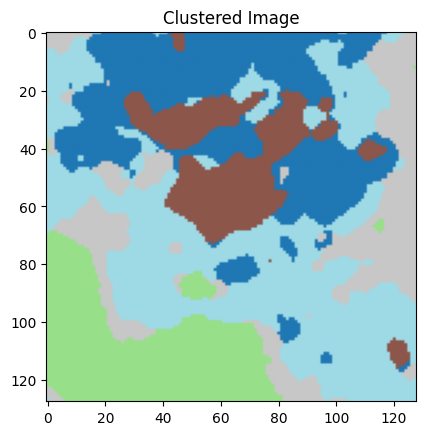

In [ ]:
from sklearn.cluster import KMeans
import numpy as np


h, w, d = embedding_patch.shape
flat_embeddings = embedding_patch.reshape(-1, d)

kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(flat_embeddings)

clustered_image = labels.reshape(h, w)

plt.imshow(clustered_image, cmap='tab20')
plt.title('Clustered Image')
